<a href="https://colab.research.google.com/github/kleeresearch/lecture/blob/main/20251112_KAIST_satellite_image_segmentation_shared.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Supervised Image Segmentation via Patch-Level Random Forest Classification

* Instructor: Kyungmin Lee, Ph.D. (kmlee@udel.edu)

* Date: Nov 12, 2025

* Seminar at the KAIST School of Digital Humanities and Computational Social Science


This notebook is created for learning the process of image segmentation:

Step 1. Load Satellite Images Using Google Map API

Step 2. Label Pixels

Step 3. Create Patches

Step 4. Build Random Forest Classifier

Step 5. Visuzlize Predicted Image





In [ ]:
import requests
from io import BytesIO
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

from skimage.util import view_as_windows
from skimage.transform import resize
from skimage.filters import sobel
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Set file directory
dir = "/content/drive/MyDrive/" + name_your_file_directory # set your file directory by creating your own folder in your drive

## STEP 1. Load Satellite Images Using Google Map API

In [ ]:
# Download google map image
def download_google_map_image(lat, lng, zoom, api_key, size=(600, 600), map_type='satellite'):
    """
    Download a Google Map image using the Static Maps API.

    Args:
        lat (float): Latitude of the center of the map.
        lng (float): Longitude of the center of the map.
        zoom (int): Zoom level (1-20).
        api_key (str): Your Google Maps API key.
        size (tuple): Size of the image (width, height) in pixels.
        map_type (str): Type of map (roadmap, satellite, terrain, hybrid).

    Returns:
        PIL.Image: The map image.
    """
    base_url = "https://maps.googleapis.com/maps/api/staticmap"
    size_str = f"{size[0]}x{size[1]}"
    params = {
        'center': f'{lat},{lng}',
        'zoom': zoom,
        'size': size_str,
        'maptype': map_type,
        'key': api_key
    }
    response = requests.get(base_url, params=params)
    if response.status_code == 200:
        image = Image.open(BytesIO(response.content))
        return image
    else:
        raise Exception(f"Error fetching map image: {response.status_code}, {response.text}")

**How to get your own Google Map API key**

The steps to get a Google Maps API key involve using the Google Cloud Platform console, where you will set up a project, enable the Maps API, and generate your credentials.

1. Set up a Google Cloud Project
2. Enable the Maps API
3. Set up a billing account (required, but often free)
4. Create the API key
5. Restrict your API key (recommended)

How to Get a Google Maps API Key in 2 Mins: https://www.youtube.com/watch?v=hsNlz7-abd0


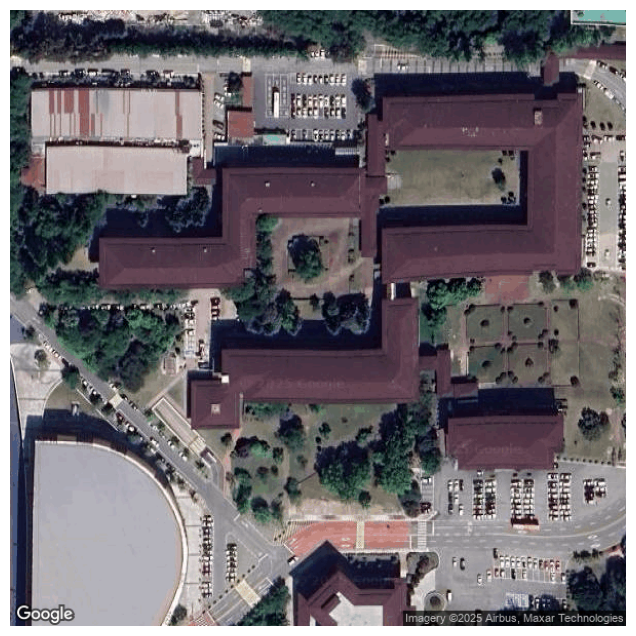

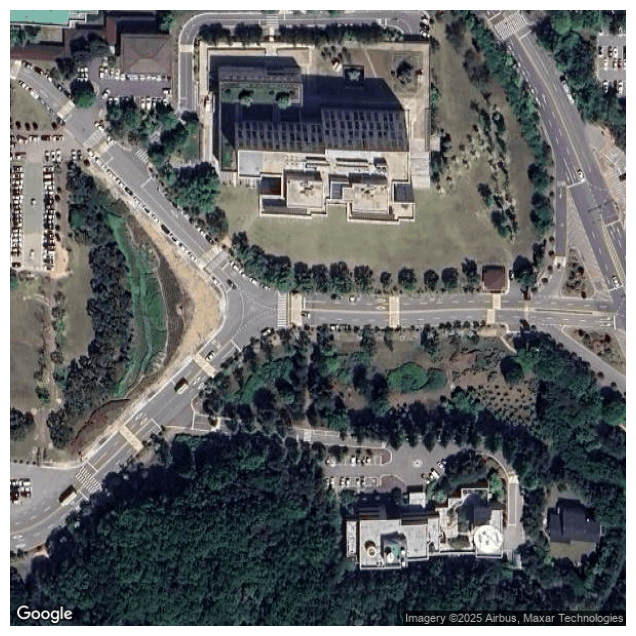

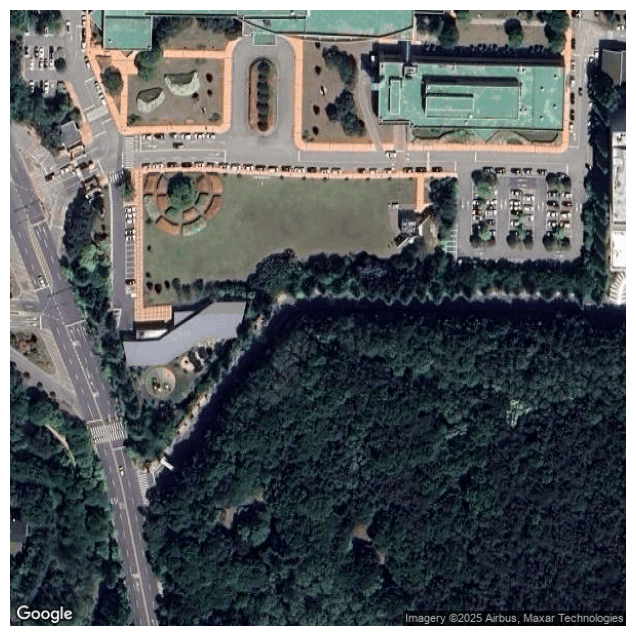

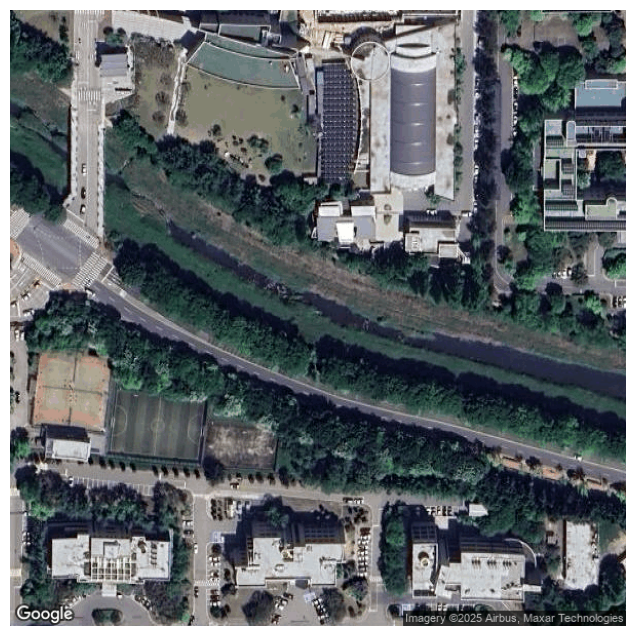

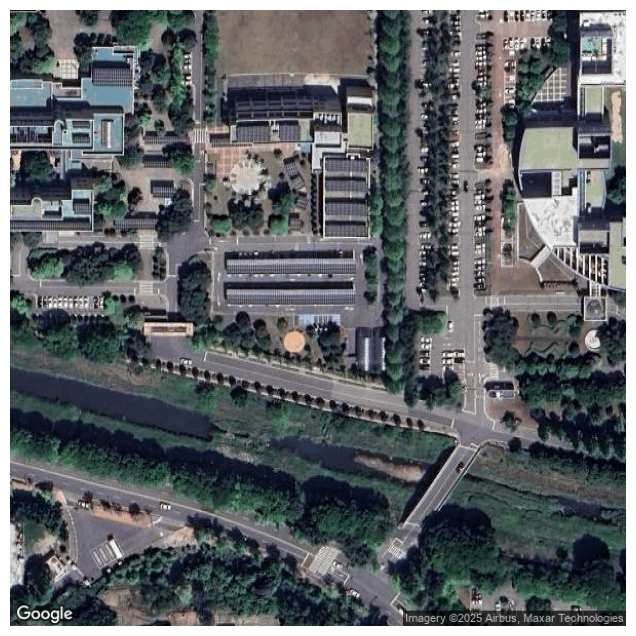

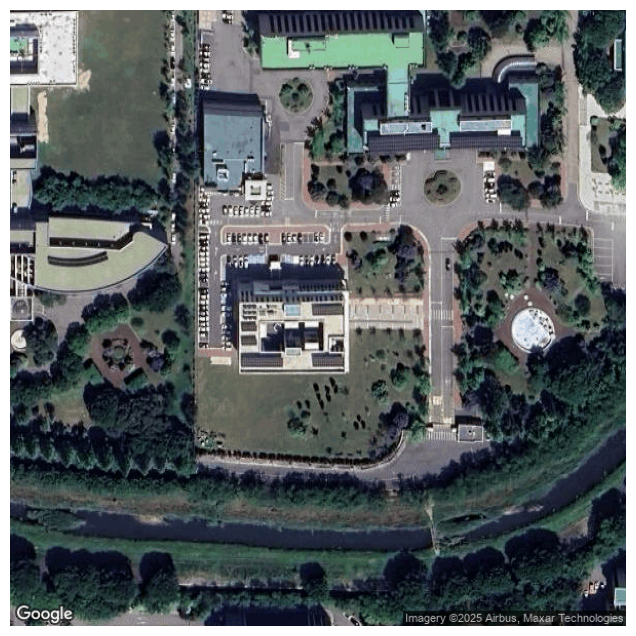

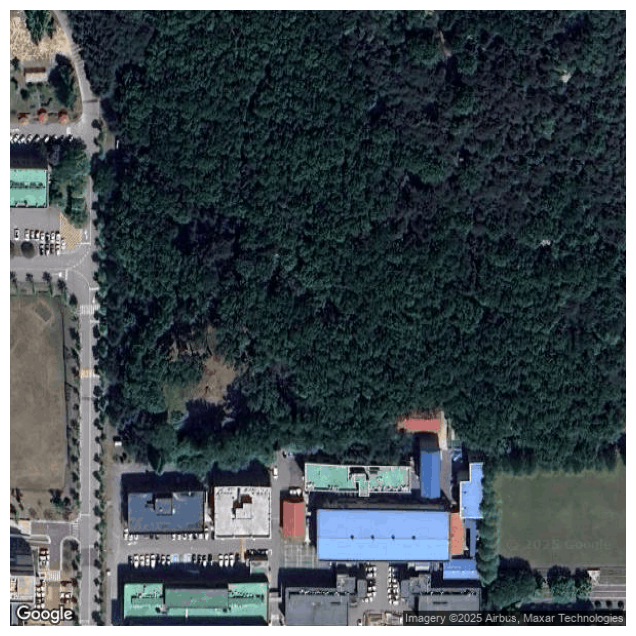

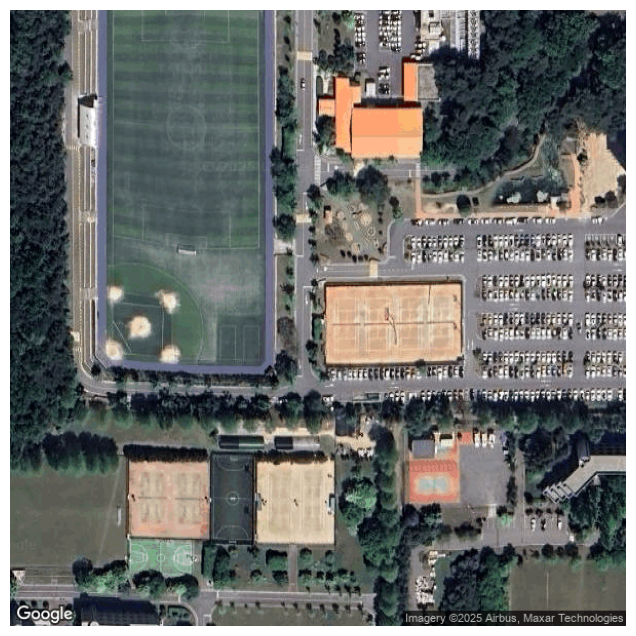

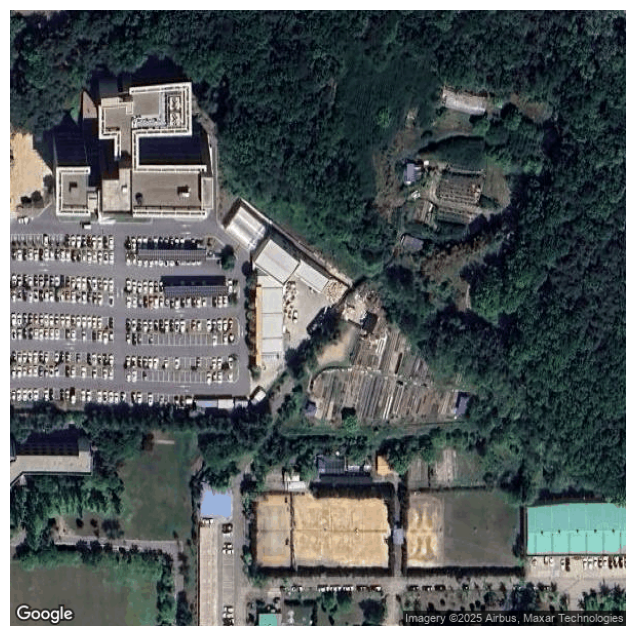

In [ ]:
# Load and save satellite images in local folder using Goolge Map API

adj_size = 0.003 # adjust sizes of moving latitude and longitude
img_num = 3 # adjust number of loaded images

# Use for loop function to load images automatically
for i in range(0,img_num):
  for j in range(0, img_num):
    if __name__ == "__main__":
        API_KEY =  # Read how to get your  API key and put your API key above
        latitude = 36.37343884610568 + adj_size*i # latitude information is copied from Google map
        longitude = 127.36268565185826 + adj_size*j# longitude information is copied from Google map
        zoom_level = 18

        try:
            map_image = download_google_map_image(latitude, longitude, zoom_level, API_KEY)
            map_image.save(dir + "/map"+str(i)+"_"+str(j)+".png")  # Save the image locally
        except Exception as e:
            print(f"An error occurred: {e}")

    # Plot the images
    file_path = dir+"/map"+str(i)+"_"+str(j)+".png"

    image = Image.open(file_path)
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')

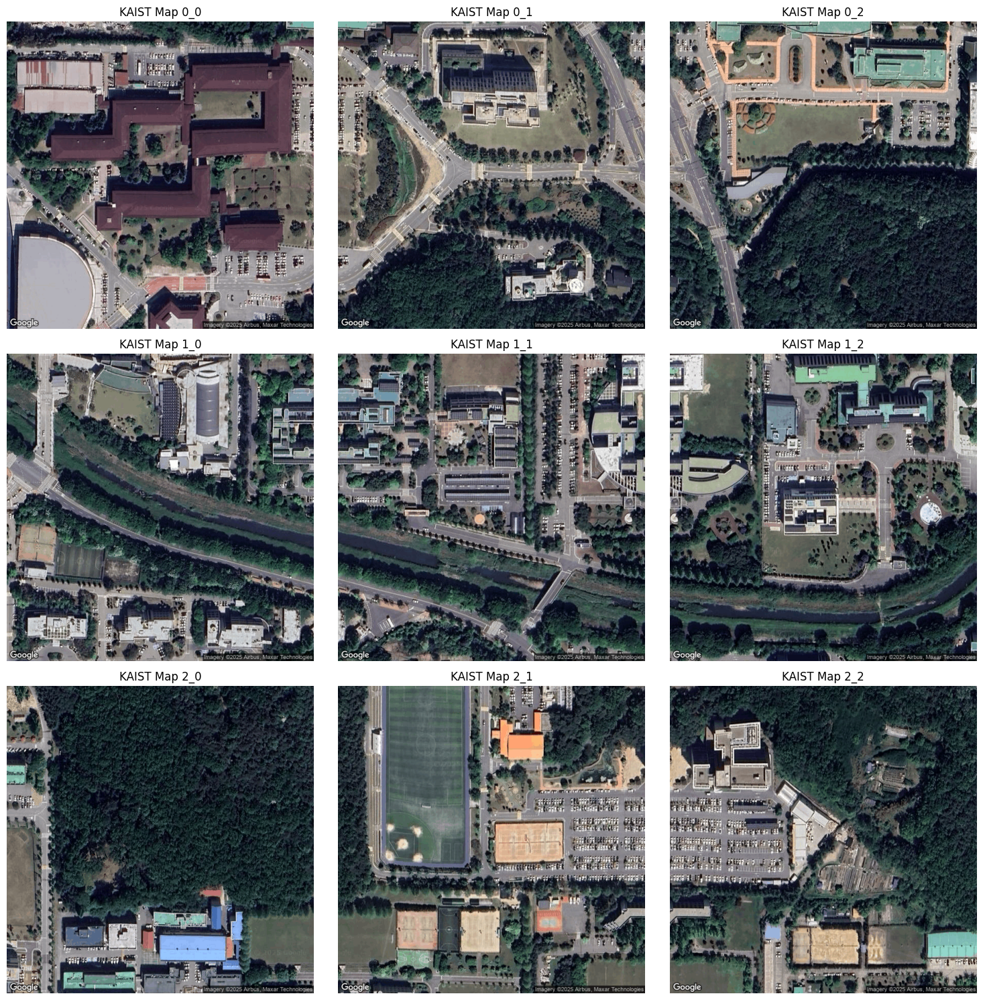

In [ ]:
# Create a N x N figure

# Define file names in order
filenames = [[f"/map0_{i}.png" for i in range(3)],
             [f"/map1_{i}.png" for i in range(3)],
             [f"/map2_{i}.png" for i in range(3)]]

# Loop through rows and columns
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
for row in range(3):
    for col in range(3):
        img_path = dir + filenames[row][col]
        img = Image.open(img_path)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')  # hide axes for cleaner look
        axes[row, col].set_title(f"KAIST Map {row}_{col}")

plt.tight_layout()
plt.show()

In [ ]:
# - Set “KAIST Map 0_0” as the test image file.
map0 = plt.imread(dir+"/map0_0.png")
map0 # Check that the image file is saved as a NumPy array consisting of pixel intensity values.

array([[[0.0627451 , 0.14117648, 0.1254902 , 1.        ],
        [0.04705882, 0.10980392, 0.10980392, 1.        ],
        [0.04705882, 0.10980392, 0.10980392, 1.        ],
        ...,
        [0.47843137, 0.7137255 , 0.68235296, 1.        ],
        [0.47843137, 0.7137255 , 0.68235296, 1.        ],
        [0.34117648, 0.49411765, 0.41960785, 1.        ]],

       [[0.0627451 , 0.14117648, 0.1254902 , 1.        ],
        [0.04705882, 0.10980392, 0.10980392, 1.        ],
        [0.0627451 , 0.14117648, 0.1254902 , 1.        ],
        ...,
        [0.47843137, 0.7137255 , 0.68235296, 1.        ],
        [0.47843137, 0.7137255 , 0.68235296, 1.        ],
        [0.40392157, 0.5568628 , 0.46666667, 1.        ]],

       [[0.0627451 , 0.14117648, 0.1254902 , 1.        ],
        [0.0627451 , 0.14117648, 0.1254902 , 1.        ],
        [0.09411765, 0.15686275, 0.17254902, 1.        ],
        ...,
        [0.47843137, 0.7137255 , 0.68235296, 1.        ],
        [0.47843137, 0.713725

In [ ]:
# - Check the shape of the image file, which consists of 600 pixels in height, 600 pixels in width, and 4 color channels (Red, Green, Blue, and Alpha for transparency).
map0.shape

(600, 600, 4)

In [ ]:
# - Since transparency (the alpha channel) is not needed, we can easily convert the image to RGB.
map0_rgb = map0[:, :, :3]
map0_rgb.shape

(600, 600, 3)

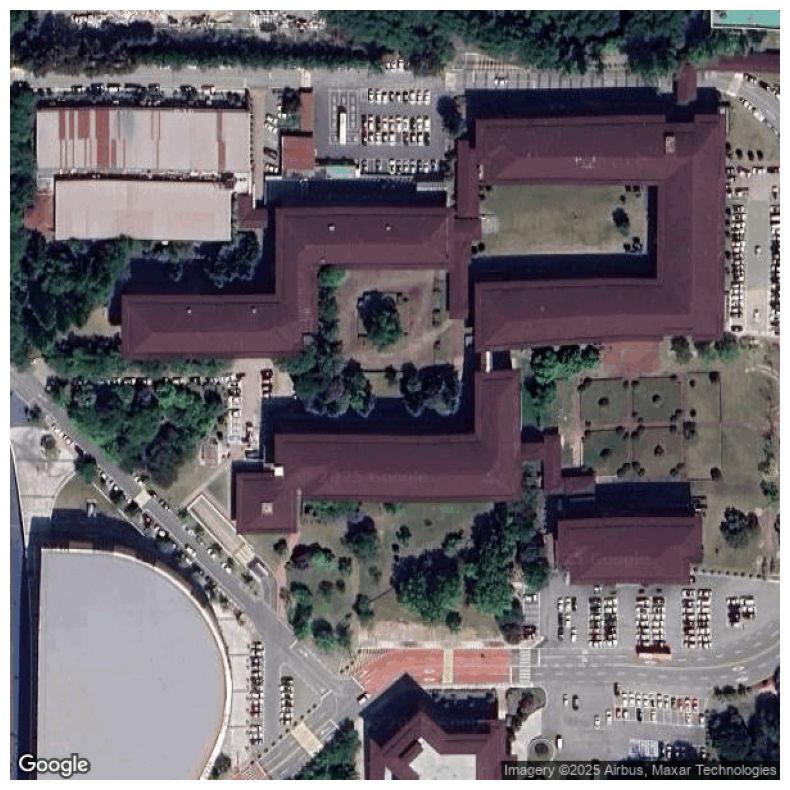

In [ ]:
# - Plot
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(map0_rgb)
ax.set_axis_off()
plt.show()

## STEP 2. Label Pixels

For building an AI model for image segmentation, we need to train the model to recognize objects in images—such as trees, buildings, cars, roads, and so on.

In this test set, I selected pixels corresponding to (1) parking lots, (2) roofs, and (3) trees for training data using the ginput function. The labeled data serve as the truth used to train and evaluate models

Since the ginput function does not work in Google Colab, the pixel labeling process needs to be performed in a local Python environment.

For more information about the ginput function, please refer to the official documentation:
https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.ginput.html

In this test set, the labeled pixel .npy files are already saved in the shared folder, so you can use them directly for this process.


In [ ]:
# - read in the labeled pixels
plot = np.load(dir + "/pixel_loc/map0_0_plot.npy")
roof = np.load(dir + "/pixel_loc/map0_0_roof.npy")
tree = np.load(dir + "/pixel_loc/map0_0_tree.npy")

plot.shape, roof.shape, tree.shape

((100, 2), (100, 2), (100, 2))

## STEP 3. Create Patches


To train an AI model for image segmentation, we first need to prepare labeled training data in a consistent format. The goal of this step is to extract fixed-size image patches (small sub-images) centered around manually labeled coordinates representing different object classes—such as parking lots, roofs, and trees.


Goal: To convert manually labeled pixel coordinates (for example, parking lot, roof, or tree points) into small, fixed-size image segments that contain the surrounding visual context. Each patch becomes one training example for supervised learning.

In [ ]:
# - Patch Dataset Creation
def extract_patches(img, coords, patch=32):
    """
    img: (H, W, 3) array, float or uint8
    coords: (N, 2) array of (x, y) image coordinates
    returns: (N, patch, patch, 3)
    """
    H, W = img.shape[:2]

    # the radius around each point.
    r = patch // 2
    # Clip coordinate values so they stay within image boundaries.
    xs = np.clip(np.round(coords[:, 0]).astype(int), 0, W - 1)
    ys = np.clip(np.round(coords[:, 1]).astype(int), 0, H - 1)

    pads = ((r, r), (r, r), (0, 0))
    # Pad the image using reflection so that points near edges can still yield full patches.
    im_pad = np.pad(img, pads, mode="reflect")
    patches = []
    for x, y in zip(xs, ys):
        # Shift by r to account for the padding.
        x0, y0 = x + r, y + r
        # Extract a square crop of size (patch, patch) centered on the labeled pixel.
        crop = im_pad[y0 - r:y0 + r, x0 - r:x0 + r]
        # Stack all cropped regions into one NumPy array.
        patches.append(crop)
        # Returns an array of shape (N, patch, patch, 3), where N is the number of labeled points.
        # Each patch is a localized sample representing one class (e.g., parking, tree, roof).
    return np.stack(patches, axis=0)

In [ ]:
# - Create Patches

# Patch Size Definition
# Each labeled coordinate will be converted into a square image patch of size 32×32 pixels.
PATCH = 32  # Adjust between 24–48 depending on object size

# Patch Extraction for Each Class
X_plot = extract_patches(map0_rgb, plot, PATCH) # parking lot
X_roof = extract_patches(map0_rgb, roof, PATCH) # roof
X_tree = extract_patches(map0_rgb, tree, PATCH) # tree

# Concatenating All Patches
# X represents the full set of image patches for training.
X = np.concatenate([X_plot, X_tree, X_roof], axis=0)

# Assigning Class Labels
# Y represents the corresponding class labels.
y = np.array([0] * len(X_plot) + [1] * len(X_tree) + [2] * len(X_roof))  # 0: parking, 1: tree, 2: roof
classes = {0: "parking", 1: "tree", 2: "roof"}

## STEP 4. Build Random Forset Classifier

This function extracts numerical features from each image patch so that a Random Forest classifier (which requires tabular data, not raw images) can learn to distinguish between object classes such as parking lots, trees, and roofs.

Goal: To convert each image patch (a small RGB image) into a compact feature vector summarizing its color and texture characteristics. These features act as descriptive signals the Random Forest model can use to classify object types.


The patch_features() function transforms raw RGB image patches into structured numeric features capturing both color and texture.
These compact features enable the Random Forest model to distinguish between visually different object classes (like trees, roofs, and parking lots) without directly processing raw image pixels.


In [ ]:
# - Build Random Forest Classifier Model
def patch_features(patches):
    """
    patches (input): (N, P, P, 3)
    returns (output): (N, F)
    """
    N, P, _, _ = patches.shape
    # Normalization: normalize to [0,1]
    X = patches.astype(np.float32)
    if X.max() > 1.5:
        X /= 255.0 # Some images are stored as 0–255, so dividing by 255 ensures consistent scaling.

    # Color Statistics: Channel-wise mean and standard deviation
    means = X.mean(axis=(1, 2)) # Mean: average color value across all pixels in each patch (summarizes overall brightness and color tone).
    stds = X.std(axis=(1, 2)) # Standard deviation: measures variation in color within the patch (texture roughness or heterogeneity).

    # Texture Feature (Edge Intensity) for detecting edge (e.g., roofs, trees, parking lots)
    # Convert RGB to Grayscale
    gray = (0.2989 * X[..., 0] + 0.5870 * X[..., 1] + 0.1140 * X[..., 2]).astype(np.float32)
    edge = sobel(gray) # Applies the Sobel filter, which detects edges (intensity gradients).
    edge_mean = edge.mean(axis=(1, 2))[:, None] # Computes the mean edge strength — a measure of texture complexity.

    # Simple color ratios (green/red, blue/red)
    eps = 1e-6
    rg = (X[..., 1].mean(axis=(1, 2)) / (X[..., 0].mean(axis=(1, 2)) + eps))[:, None]
    bg = (X[..., 2].mean(axis=(1, 2)) / (X[..., 0].mean(axis=(1, 2)) + eps))[:, None]

    # Feature Concatenation
    feats = np.concatenate([means, stds, edge_mean, rg, bg], axis=1)
    # Each vector includes: 3 color means, 3 color standard deviations, 1 texture (edge mean), 2 color ratios, Total: 9 features per patch
    return feats

In [ ]:
# - Apply Random Forest Classifier Model

# Converts each patch into a numeric feature vector (color stats, texture, ratios).
F = patch_features(X)

# rain/validation split (stratified)
Xtr, Xte, ytr, yte = train_test_split(F, y, test_size=0.25, stratify=y, random_state=42) # Splits test size into 75%/25% while preserving class proportions (parking/tree/roof).

# Standardize features: Centers/scales features.
scaler = StandardScaler().fit(Xtr)
Xtr_s = scaler.transform(Xtr)
Xte_s = scaler.transform(Xte)

# Fit a Random Forest
rf = RandomForestClassifier(
    n_estimators=400, # number of trees (more → stabler, slower).
    max_depth=None, # trees grow until pure or leaf-size limits → high capacity.
    random_state=0, # reproducibility.
    class_weight="balanced" # compensates if classes are imbalanced.
)
rf.fit(Xtr_s, ytr)
print("Random Forest Evaluation:")
print(confusion_matrix(yte, rf.predict(Xte_s))) # counts of correct/incorrect by class.
print(classification_report(yte, rf.predict(Xte_s), target_names=[classes[i] for i in range(3)])) # precision, recall, F1, and support per class + macro/weighted averages.

Random Forest Evaluation:
[[25  0  0]
 [ 0 25  0]
 [ 0  0 25]]
              precision    recall  f1-score   support

     parking       1.00      1.00      1.00        25
        tree       1.00      1.00      1.00        25
        roof       1.00      1.00      1.00        25

    accuracy                           1.00        75
   macro avg       1.00      1.00      1.00        75
weighted avg       1.00      1.00      1.00        75



Please note that the F1-score indicates 100% accuracy since both the ground-truth labels and the predictions were derived from the same image tile (map0_0), which may lead to overly optimistic results.

## STEP 5. Visualize Predicted Image

Goal: Produce a dense class map over the whole image by sliding a fixed-size patch window and classifying each window with your trained Random Forest. The result is a low-resolution segmentation (downsampled by stride) that you can overlay on the original image.

In [ ]:
# - Create Dense Prediction Map (Sliding Window, stride=4)
def dense_predict_rf(img, patch=32, stride=4):
    H, W = img.shape[:2]

    # Padding for safe cropping - Pads the image so patches centered near the borders can still be extracted without going out of bounds.
    r = patch // 2
    pads = ((r, r), (r, r), (0, 0))
    im_pad = np.pad(img, pads, mode="reflect")

    # Build a sampling grid - Creates a grid of (x, y) locations across the image, spaced by stride pixels.
    yy = np.arange(0, H, stride)
    xx = np.arange(0, W, stride)
    coords = np.array([(x, y) for y in yy for x in xx])

    # Extract patches at each grid point - For every grid coordinate, cut out a patch × patch RGB crop centered at that point.
    patches = extract_patches(img, coords, patch)

    # Featureize and classify
    feats = patch_features(patches)
    preds = rf.predict(scaler.transform(feats)).reshape(len(yy), len(xx))
    return preds, yy, xx

preds, yy, xx = dense_predict_rf(map0_rgb, PATCH, stride=4)

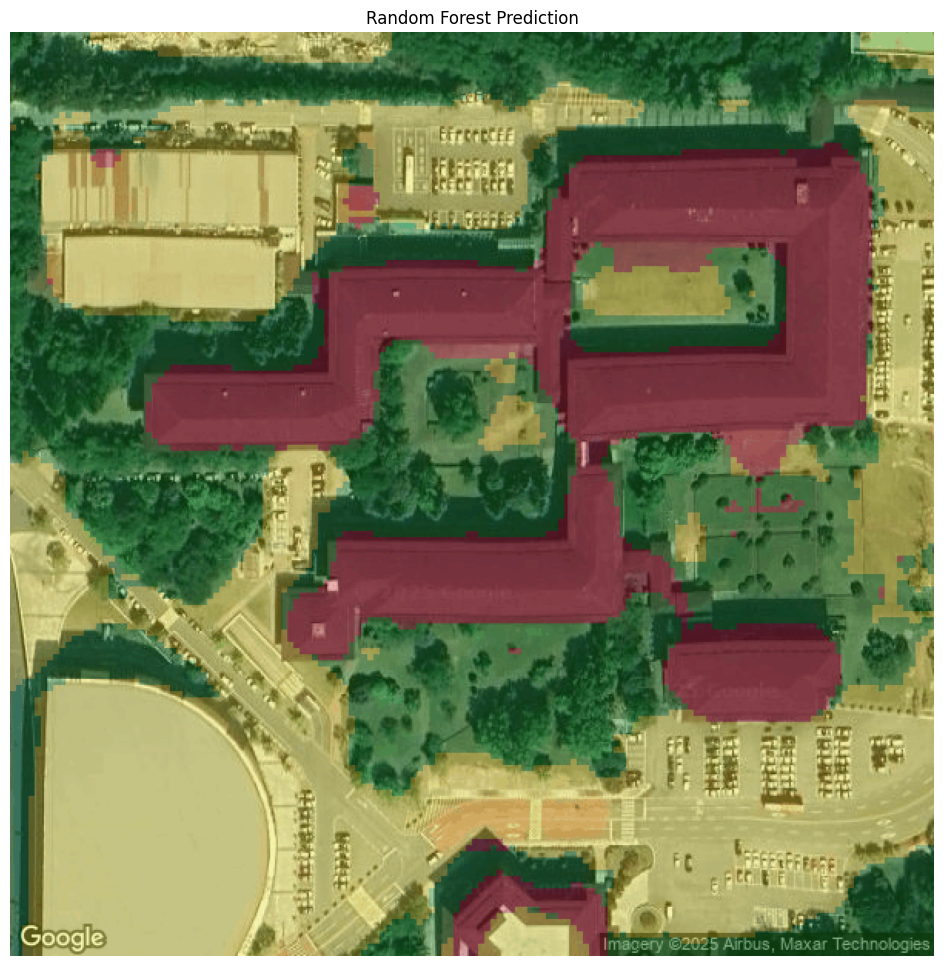

In [ ]:
# Visualization
palette = np.array([
    [230, 230, 30],   # parking: yellow
    [30, 160, 30],    # tree: green
    [200, 50, 50]     # roof: red
]) / 255.0

viz = palette[preds]
plt.figure(figsize=(12, 12))
plt.imshow(map0_rgb)
plt.imshow(viz.repeat(4, 0).repeat(4, 1), alpha=0.35)  # interpolate stride=4
plt.title("Random Forest Prediction")
plt.axis("off")
plt.show()

# Discussion & Conclusion


If train/test both come from the same image, scores can be over-optimistic due to spatial leakage. Prefer block/tiling splits or leave-one-tile-out validation.

More advanced method can be applied:

1. To avoid spatial leakage, you should train on map0_0 and evaluate on a different tile like map0_1 (ideally several tiles). Need labels for multiple tiles (map0_0, map0_1, …) to do this.

2. If only map0_0 has labels (common case)

Quantitative: label a small validation set on map0_1 (e.g., 20–30 points/class). Train on map0_0, test on those new labels.

Qualitative: even without labels, run dense prediction on map0_1 and inspect overlays. This won’t give a number, but it exposes overfitting quickly.

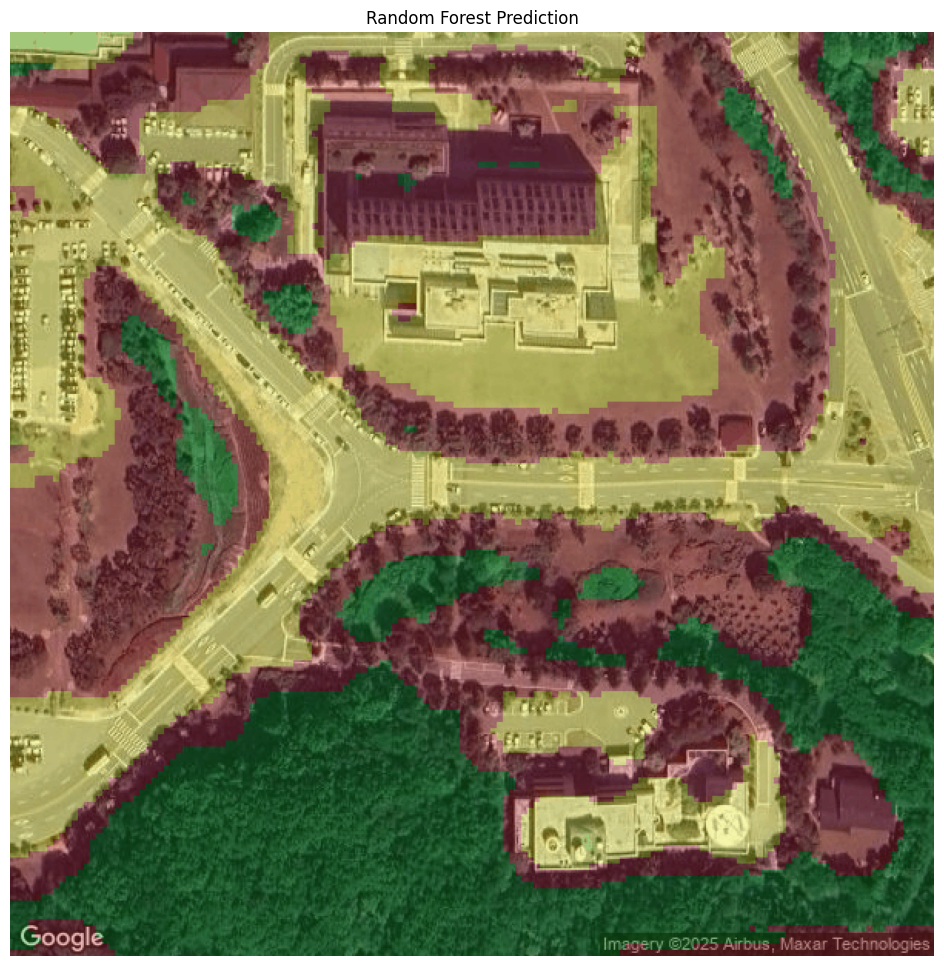

In [ ]:
# Test qualitative check - run dense prediction on map0_1 based on labels from map0_0

# - Set “KAIST Map 0_1” as the test image file.
map0_1_rgb = plt.imread(dir+"/map0_1.png")[:, :, :3]

# Train
preds, _, _ = dense_predict_rf(map0_1_rgb, patch=32, stride=4)  # qualitative check

# Visualization
palette = np.array([
    [230, 230, 30],   # parking: yellow
    [30, 160, 30],    # tree: green
    [200, 50, 50]     # roof: red
]) / 255.0

viz = palette[preds]
plt.figure(figsize=(12, 12))
plt.imshow(map0_1_rgb)
plt.imshow(viz.repeat(4, 0).repeat(4, 1), alpha=0.35)  # interpolate stride=4
plt.title("Random Forest Prediction")
plt.axis("off")
plt.show()

Since qualitive check result does not present high accuracy for prediction, labeling pixels on more different tiles like map0_1, map0_2, and map0_3, is needed to avoid spatial leakage.